**Check In #1:**

Goal: Predicting the genre of a track

Our team has chosen the Hugging Face Spotify Tracks dataset.

The key features we have decided to study are **popularity, duration, danceability, energy, key, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo**, track genre(for training) because these would be most useful for genre prediction.





In [2]:
%pip install datasets
%pip install plotly
%pip install matplotlib
%pip install seaborn
%pip install datascience
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd

df = pd.read_csv("hf://datasets/maharshipandya/spotify-tracks-dataset/dataset.csv")

In [4]:
from datascience import *
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt


In [5]:
df.columns


Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [6]:
df.sample(10)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
23932,23932,4SwL4ZshYgrZG0luM7aoot,Eklo;Pegato;JordinLaine,Feel So High (feat. JordinLaine) (Pegato Remix),Feel So High (feat. JordinLaine) (Pegato Remix),52,248424,False,0.759,0.800,...,-6.905,1,0.0367,0.19500,0.008660,0.4530,0.301,109.988,4,deep-house
39014,39014,3rX3R3OoyikoECxdgQ9tnL,Robin Schulz;Tom Walker,Cardio Tracks,Sun Will Shine,0,201700,False,0.534,0.714,...,-6.347,0,0.0629,0.00633,0.000000,0.0879,0.415,125.990,4,german
559,559,6xTLXrdNqOTcTUHwPh8Wp1,Edy Hafler,Game of Thrones,Game of Thrones,41,89268,False,0.340,0.309,...,-12.980,0,0.0500,0.85500,0.903000,0.1680,0.153,176.899,3,acoustic
31782,31782,44I5NYJ7CGEcaLOuG2zJsU,Alec Benjamin,These Two Windows,Oh My God,64,187727,False,0.696,0.565,...,-7.241,0,0.0598,0.65200,0.000002,0.1210,0.600,156.109,4,electro
38613,38613,7aJDkh2HFAeirsG67P8EkC,The Strypes,Little Victories (Deluxe),I Need To Be Your Only,49,225920,False,0.457,0.870,...,-6.002,0,0.0411,0.00454,0.004330,0.2230,0.406,149.943,4,garage
37614,37614,22K3jhzhPwH3TatxENt49A,Felp 22;JP Diazz;Medellin,Ouro Rosé,Ouro Rosé,47,146822,True,0.748,0.689,...,-5.981,1,0.0600,0.05370,0.000000,0.2430,0.355,120.026,4,funk
7587,7587,0w8Akuz8cCGSJmfhWKXXlO,Old Crow Medicine Show,Best Of,Heart up in the Sky,24,223946,False,0.473,0.588,...,-7.477,1,0.0531,0.66100,0.000000,0.1140,0.948,182.906,4,bluegrass
68282,68282,0rXUq0QEtQg4gRvd4EPHGf,Jhayco,Perreo Tenebroso Vol. 4,Christian Dior,0,147133,True,0.835,0.718,...,-5.620,0,0.0694,0.22600,0.000002,0.1080,0.427,92.028,4,latino
11806,11806,35Vb6CUvrLrpC9JOmh5NhH,Adele,Send My Love (To Your New Lover),Send My Love (To Your New Lover),42,223078,False,0.688,0.533,...,-8.363,0,0.0865,0.03550,0.000003,0.1720,0.567,164.069,4,british
81353,81353,0QzuaeCEEOV40Pn7IvKEny,dhruv,rapunzel,double take,83,171743,False,0.656,0.436,...,-11.141,1,0.0744,0.84500,0.000000,0.2210,0.196,109.239,4,pop


The one missing row might be because the name and artists are in Korean since it is a k-pop genre song.



In [7]:
missing_prop = df.isna().sum() / len(df.index)
missing_prop.sort_values()
missing_rows = df[df.isna().any(axis=1)]

print("Number of missing data rows:", len(missing_rows))
print("Missing data rows:")
print(missing_rows)


Number of missing data rows: 1
Missing data rows:
       Unnamed: 0                track_id artists album_name track_name  \
65900       65900  1kR4gIb7nGxHPI3D2ifs59     NaN        NaN        NaN   

       popularity  duration_ms  explicit  danceability  energy  ...  loudness  \
65900           0            0     False         0.501   0.583  ...     -9.46   

       mode  speechiness  acousticness  instrumentalness  liveness  valence  \
65900     0       0.0605          0.69           0.00396    0.0747    0.734   

         tempo  time_signature  track_genre  
65900  138.391               4        k-pop  

[1 rows x 21 columns]


In [8]:
# list of number of tracks (rows) in each unique track_genre
for genre in df['track_genre'].unique():
  print(f"{genre}: {len(df[df['track_genre'] == genre])}")

acoustic: 1000
afrobeat: 1000
alt-rock: 1000
alternative: 1000
ambient: 1000
anime: 1000
black-metal: 1000
bluegrass: 1000
blues: 1000
brazil: 1000
breakbeat: 1000
british: 1000
cantopop: 1000
chicago-house: 1000
children: 1000
chill: 1000
classical: 1000
club: 1000
comedy: 1000
country: 1000
dance: 1000
dancehall: 1000
death-metal: 1000
deep-house: 1000
detroit-techno: 1000
disco: 1000
disney: 1000
drum-and-bass: 1000
dub: 1000
dubstep: 1000
edm: 1000
electro: 1000
electronic: 1000
emo: 1000
folk: 1000
forro: 1000
french: 1000
funk: 1000
garage: 1000
german: 1000
gospel: 1000
goth: 1000
grindcore: 1000
groove: 1000
grunge: 1000
guitar: 1000
happy: 1000
hard-rock: 1000
hardcore: 1000
hardstyle: 1000
heavy-metal: 1000
hip-hop: 1000
honky-tonk: 1000
house: 1000
idm: 1000
indian: 1000
indie-pop: 1000
indie: 1000
industrial: 1000
iranian: 1000
j-dance: 1000
j-idol: 1000
j-pop: 1000
j-rock: 1000
jazz: 1000
k-pop: 1000
kids: 1000
latin: 1000
latino: 1000
malay: 1000
mandopop: 1000
metal: 100

# **Data Cleaning:**

There is only 1 row missing some values, so we are removing this row.

In [9]:
df = df.dropna()
missing_prop = df.isna().sum() / len(df.index)
missing_prop.sort_values()
missing_rows = df[df.isna().any(axis=1)]

print("Number of missing data rows:", len(missing_rows))
print("Missing data rows:")
print(missing_rows)


Number of missing data rows: 0
Missing data rows:
Empty DataFrame
Columns: [Unnamed: 0, track_id, artists, album_name, track_name, popularity, duration_ms, explicit, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, time_signature, track_genre]
Index: []

[0 rows x 21 columns]


# **Exploratory Data Analysis:**

Average popularity per Genre

In [10]:
avg_popularity_per_genre = df.groupby('track_genre')['popularity'].mean().reset_index()
avg_popularity_per_genre.columns = ["Genre", "Avg Popularity"]
avg_popularity_per_genre = avg_popularity_per_genre.sort_values(by='Avg Popularity', ascending=False)

avg_popularity_per_genre

,Genre,Avg Popularity
81,pop-film,59.283000
65,k-pop,56.952953
15,chill,53.651000
94,sad,52.379000
44,grunge,49.594000
...,...,...
13,chicago-house,12.339000
24,detroit-techno,11.174000
67,latin,8.297000
93,romance,3.245000


Average Danceability Per Genre Table:

In [11]:
avg_dance_per_genre = df.groupby('track_genre')['danceability'].mean().reset_index()
avg_dance_per_genre.columns = ["Genre", "Avg Danceability"]
avg_dance_per_genre_sorted = avg_dance_per_genre.sort_values(by='Avg Danceability', ascending=True)
pd.set_option('display.max_rows', None)
print(avg_dance_per_genre_sorted)


                 Genre  Avg Danceability
101              sleep          0.167923
42           grindcore          0.271854
6          black-metal          0.296411
59             iranian          0.300686
76               opera          0.313563
75             new-age          0.348455
4              ambient          0.367867
22         death-metal          0.368411
16           classical          0.381923
113        world-music          0.414572
72           metalcore          0.423800
50         heavy-metal          0.428500
93             romance          0.432133
79               piano          0.455098
44              grunge          0.457062
26              disney          0.462874
98          show-tunes          0.463738
71               metal          0.464288
40              gospel          0.473298
82           power-pop          0.473410
41                goth          0.478875
47           hard-rock          0.482250
38              garage          0.484264
85              

Average Energy Value Per Genre Table:

In [12]:
avg_energy_per_genre = df.groupby('track_genre')['energy'].mean().reset_index()
avg_energy_per_genre.columns = ['Genre', 'Average Energy']
avg_energy_per_genre_sorted = avg_energy_per_genre.sort_values(by='Average Energy', ascending=True)
pd.set_option('display.max_rows', None)
print(avg_energy_per_genre_sorted)

                 Genre  Average Energy
16           classical        0.189827
75             new-age        0.214501
4              ambient        0.237162
93             romance        0.294304
26              disney        0.302519
76               opera        0.317054
79               piano        0.320103
45              guitar        0.324999
101              sleep        0.342072
64                jazz        0.352954
52          honky-tonk        0.366957
108              tango        0.372828
98          show-tunes        0.398742
105              study        0.410658
15               chill        0.426723
99   singer-songwriter        0.434188
102         songwriter        0.434188
0             acoustic        0.435368
12            cantopop        0.461696
94                 sad        0.462470
14            children        0.494645
70            mandopop        0.498434
11             british        0.507127
91         rock-n-roll        0.526615
7            bluegrass   

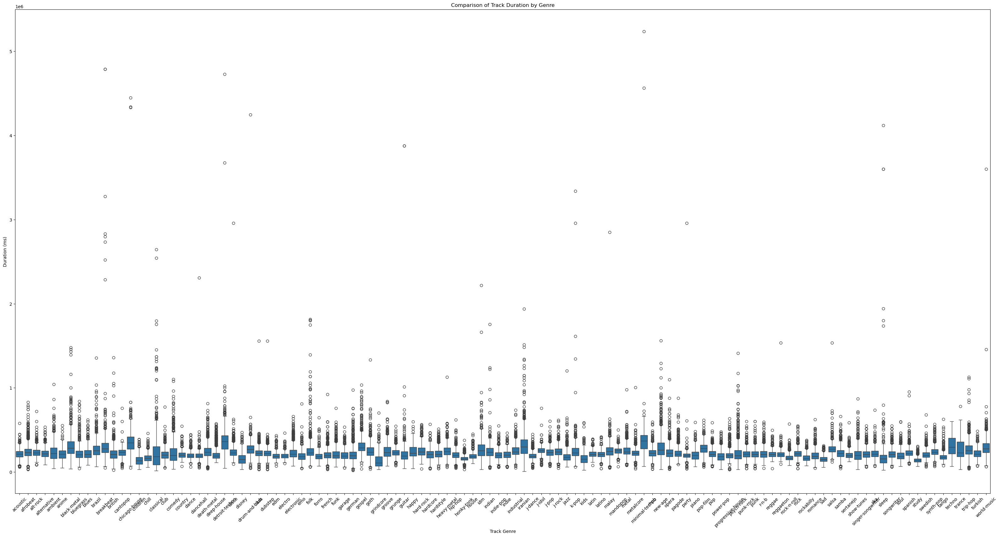

In [13]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the plot size
plt.figure(figsize=(40, 20))

# Create a box plot
sns.boxplot(x='track_genre', y='duration_ms', data = df)

# Set labels and title
plt.title('Comparison of Track Duration by Genre')
plt.xlabel('Track Genre')
plt.ylabel('Duration (ms)')

# Rotate x labels for better readability if there are many genres
plt.xticks(rotation=45)

# Show the plot
plt.show()

# Week 3

In [14]:
from sklearn.model_selection import train_test_split

# note train_test_split shuffles the data set by default

# first split the dataset into 70% training and 30% temp
train_data, temp_data = train_test_split(df, test_size=0.3, random_state=42)

# then split the temp dataset into 15% testing and 15% validation
test_data, val_data = train_test_split(temp_data, test_size=0.5, random_state=42)

print(f'Training data shape: {train_data.shape}')
print(f'Testing data shape: {test_data.shape}')
print(f'Validation data shape: {val_data.shape}')

# If need to remake these datasets, uncomment to create new CSV files
# train_data.to_csv('csv/train_data.csv', index=False)
# test_data.to_csv('csv/test_data.csv', index=False)
# val_data.to_csv('csv/val_data.csv', index=False)

Training data shape: (79799, 21)
Testing data shape: (17100, 21)
Validation data shape: (17100, 21)


In [15]:
# for consistency, everyone should use the same datasets by reading the same csv files

train_data = pd.read_csv("./csv/train_data.csv")
test_data = pd.read_csv("./csv/test_data.csv")
val_data = pd.read_csv("./csv/val_data.csv")

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_scaled = []
y = []

for d in [train_data, test_data, val_data]:
    non_numeric_cols = d.select_dtypes(include=['object']).columns
    # print(non_numeric_cols)

    X = d.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre'])
    y.append(d['popularity'])

    # for lasso:
    scaler = StandardScaler()
    X_scaled.append(scaler.fit_transform(X))

In [17]:
# training data
X_train = X_scaled[0]
y_train = y[0]

# testing data
X_test = X_scaled[1]
y_test = y[1]

# validation data
X_val = X_scaled[2]
y_val = y[2]

### Regularization
We are using lasso regression (L1 Regularization)

In [18]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

lasso = Lasso(alpha=0.1) # try changing alpha to make it better!
lasso.fit(X_train, y_train)

y_val_pred = lasso.predict(X_val)
#MSE
val_mse = mean_squared_error(y_val, y_val_pred)
print(f"Validation MSE: {val_mse}")

lasso_coefficients = lasso.coef_
feature_names = X.columns
# feature_names = df.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre']).columns
important_features = [(feature, coef) for feature, coef in zip(feature_names, lasso_coefficients) if coef != 0]
important_features = sorted(important_features, key=lambda x: abs(x[1]), reverse=True)

print("Important Features:")
for feature, coef in important_features:
    print(f"{feature}: {coef}")

Validation MSE: 482.86028217945733
Important Features:
instrumentalness: -2.4147028750099873
valence: -2.2671419290598616
speechiness: -1.418747157755636
danceability: 1.2105724310109751
explicit: 0.8757417797762871
Unnamed: 0: 0.4617996878219175
time_signature: 0.4068828297359902
tempo: 0.30046698670147104
mode: -0.2540433439760859
loudness: 0.254012747740908
energy: -0.17883783434738718
acousticness: -0.09365770338322732
duration_ms: -0.09162713619712602
liveness: 0.0223332280720167


 Based on these lasso regression results to find the most important predictors of popularity, we have decided to use Danceability as our predictors of popularity so we can apply linear regression. 
 
 One question we have: we are a bit confused about why valence is a big negative predictor of popularity. Some of the lasso regression results were did not exactly align with our own assumptions of what they should be. 

In [19]:
#Linear and LAD Regression Models
from sklego.linear_model import LADRegression
from sklearn.linear_model import LinearRegression

lad_fit = LADRegression()
lad_fit.fit(X_train, y_train)

ls_fit = LinearRegression()
ls_fit.fit(X_train,y_train)
print("Intercept: ", ls_fit.intercept_)
print("Coefficients: ", ls_fit.coef_[0])

Intercept:  33.2653007519
Coefficients:  0.556606970401


In [20]:
import plotly.graph_objects as go

# plot both the LS and LAD lines on top of the scatterplot of gr_liv_area against sale_price
fig = px.scatter(train_data, x='danceability', y='popularity')
fig.add_trace(
    go.Scatter(x=train_data['danceability'],
                y=lad_fit.intercept_ + train_data['danceability'] * lad_fit.coef_[0],
                mode='lines',
                name='LAD',
                line={'dash': 'dash',
                      'color': 'red'})
                # L1 model
)
fig.add_trace(
    go.Scatter(x=train_data['danceability'],
                y=ls_fit.intercept_ + train_data['danceability'] * ls_fit.coef_[0],
                mode='lines',
                name='LS',
                line={'dash': 'solid',
                      'color': 'black'})
                # L2 model
)
fig.update_traces(marker=dict(size=2))

Not great for visualization, let's try a different form of regression.

In [21]:
# Linear Model Evaluation

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Training Data
pred_train_df = pd.DataFrame( # dataframe to compare true value to predicted value
    {'true': y_train,
     'ls_pred': ls_fit.predict(np.array(X_train))})

# compute the rMSE, MAE, MAD, correlation and R2 of true value with predictions
print('LS rMSE:', np.sqrt(mean_squared_error(pred_train_df['true'], pred_train_df['ls_pred'])))
print('LS MAE:', mean_absolute_error(pred_train_df['true'], pred_train_df['ls_pred']))
print('LS MAD:', np.median(np.abs(pred_train_df['true'] - pred_train_df['ls_pred'])))
print('LS correlation:', np.corrcoef(pred_train_df['true'], pred_train_df['ls_pred'])[0, 1])
print('LS R2:', r2_score(pred_train_df['true'], pred_train_df['ls_pred']))

# Validation Data
pred_val_df = pd.DataFrame( # dataframe to compare true value to predicted value
    {'true': y_val,
     'ls_pred': ls_fit.predict(np.array(X_val))})

# compute the rMSE, MAE, MAD, correlation and R2 of true value with predictions
print('LS rMSE:', np.sqrt(mean_squared_error(pred_val_df['true'], pred_val_df['ls_pred'])))
print('LS MAE:', mean_absolute_error(pred_val_df['true'], pred_val_df['ls_pred']))
print('LS MAD:', np.median(np.abs(pred_val_df['true'] - pred_val_df['ls_pred'])))
print('LS correlation:', np.corrcoef(pred_val_df['true'], pred_val_df['ls_pred'])[0, 1])
print('LS R2:', r2_score(pred_val_df['true'], pred_val_df['ls_pred']))

LS rMSE: 22.0393643843
LS MAE: 18.378427291
LS MAD: 15.9652304617
LS correlation: 0.161013356635
LS R2: 0.02592530101480972
LS rMSE: 21.9695910058
LS MAE: 18.3143020336
LS MAD: 15.8762158042
LS correlation: 0.157469512411
LS R2: 0.02470036472170356


#### Applying Ridge Regression

In [22]:
# for ridge regression
X = df.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre'])
y = df['popularity']

In [23]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold, cross_validate, learning_curve


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(X_scaled.shape)

alphas = np.logspace(-1, 6, 100)
kf = KFold(n_splits=10, shuffle=True, random_state=42)


ridge_cv_scores = []
for alpha in alphas:
  ridge = Ridge(alpha=alpha)
  ridge_cv = cross_validate(estimator=ridge,
                              X=X_scaled,
                              y=y,
                              cv=kf,
                              scoring='neg_root_mean_squared_error')
  ridge_cv_scores.append({'alpha': alpha,
                            'log_alpha': np.log(alpha),
                            'test_mse': -np.mean(ridge_cv['test_score'])})

ridge_cv_scores_df = pd.DataFrame(ridge_cv_scores)
px.line(ridge_cv_scores_df,
        x='log_alpha',
        y='test_mse',
        title='Ridge')  

#find best alpha
ridge_alpha_min = ridge_cv_scores_df.sort_values(by='test_mse').head(1).alpha.values[0]

mse_se_ridge = ridge_cv_scores_df['test_mse'].std() / np.sqrt(10)
mse_min_ridge = ridge_cv_scores_df['test_mse'].min()

ridge_alpha_1se = ridge_cv_scores_df[(ridge_cv_scores_df['test_mse'] <= mse_min_ridge + mse_se_ridge) &
                                     (ridge_cv_scores_df['test_mse'] >= mse_min_ridge - mse_se_ridge)].sort_values(by='alpha', ascending=False).head(1).alpha.values[0]

print('Ridge (min): ', ridge_alpha_min)
print('Ridge (1SE): ', ridge_alpha_1se)

ridge_min_fit = Ridge(alpha=ridge_alpha_min).fit(X=X_scaled, y=y)
ridge_1se_fit = Ridge(alpha=ridge_alpha_1se).fit(X=X_scaled, y=y)




(113999, 15)
Ridge (min):  403.70172586
Ridge (1SE):  23644.8941265


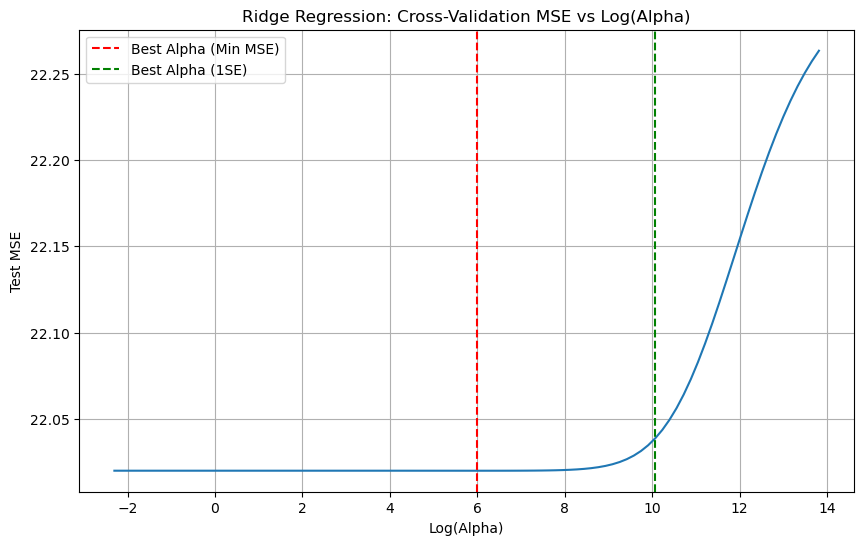

In [24]:
plt.figure(figsize=(10, 6))
plt.plot(ridge_cv_scores_df['log_alpha'], ridge_cv_scores_df['test_mse'])
plt.title('Ridge Regression: Cross-Validation MSE vs Log(Alpha)')
plt.xlabel('Log(Alpha)')
plt.ylabel('Test MSE')
plt.axvline(x=np.log(ridge_alpha_min), color='r', linestyle='--', label='Best Alpha (Min MSE)')
plt.axvline(x=np.log(ridge_alpha_1se), color='g', linestyle='--', label='Best Alpha (1SE)')
plt.legend()
plt.grid()
plt.show()


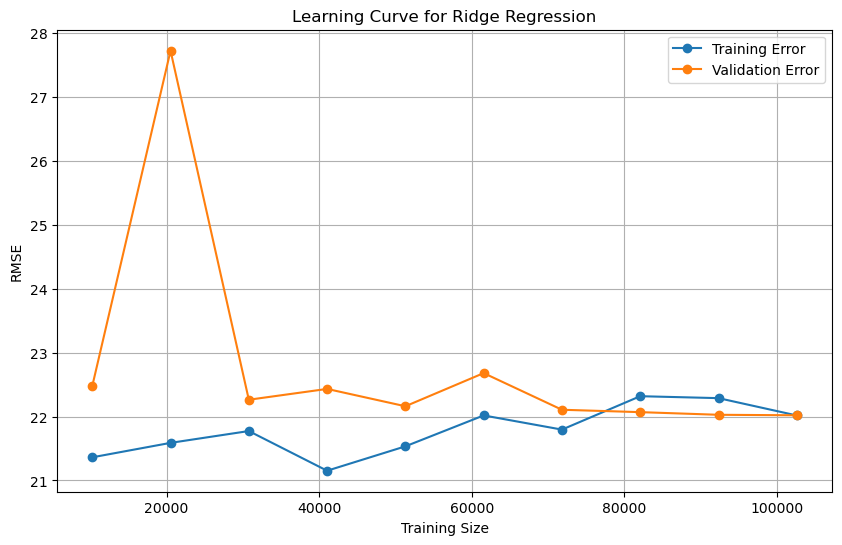

In [25]:
train_sizes, train_scores, test_scores = learning_curve(
    Ridge(alpha=ridge_alpha_min), X_scaled, y, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), cv=kf, scoring='neg_root_mean_squared_error'
)
train_scores_mean = -np.mean(train_scores, axis=1)  # Negate to convert from negative RMSE to positive
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = -np.mean(test_scores, axis=1)    # Negate to convert from negative RMSE to positive
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Error', marker='o')
plt.plot(train_sizes, test_scores_mean, label='Validation Error', marker='o')
plt.title('Learning Curve for Ridge Regression')
plt.xlabel('Training Size')
plt.ylabel('RMSE')
plt.legend()
plt.grid()
plt.show()

# Overfitting or Underfitting?
This graph shows that from 20000 to about 30000 (training size), the training error and validation error gap being really big means the model is overfitting, meaning the model isn't good at generalizing at this smaller size. Then the error gap decreases after 40000 and continues to improve.

**WEEK 4**

Logistic Regression

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve

In [ ]:
response = df['mode']

In [ ]:
X = df[['acousticness', 'energy', 'key']]
y = df['mode']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)

In [ ]:
model = LogisticRegression()
model.fit(X_train, y_train)

In [ ]:
# prediction accuracy and error
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Prediction Accuracy: {accuracy * 100:.2f}%")
print(f"Prediction Error: {(1-accuracy) * 100:.2f}%")

In [ ]:
# confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.show()

In [ ]:
# True posiive and negative rate
truePositiveRate = cm[1,1] / (cm[1,1] + cm[1,0])
falsePositiveRate = cm[0,1] / (cm[0,1] + cm[0,0])
print(f"True Positive Rate: {truePositiveRate:.2f}")
print(f"True Negative Rate: {falsePositiveRate:.2f}")

In [ ]:
# ROC Curve
y_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='darkorange')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score

# --------------------------
# K-Fold Cross-Validation
# --------------------------

# TODO
# We'll use the previously selected features for this exercise (or all features if you haven't done feature selection yet)
X_cv =  X
y_cv =  y

# Initialize the logistic regression model
model_cv = LogisticRegression()

# Perform 5-Fold Cross-Validation
cv_scores = cross_val_score(model_cv, X_cv, y_cv, cv=5)

# Output the cross-validation scores for each fold
# Modify the printed scores to the acutal cv_scores
print(f"Cross-Validation Scores for each fold: {cv_scores}")
print(f"Mean Cross-Validation Accuracy: {np.mean(cv_scores) * 100:.2f}%")
